In [1]:
%cd /home/aditya/Documents/SOMBL/
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
from tqdm import tqdm
import seaborn as sns

import scripts.plot_utils as putils
import scripts.plot_densities as pdens
import scripts.calc_grgrstar_funcs as grfuncs

sns.set()

%config InlineBackend.figure_format = 'svg'

/home/aditya/Documents/SOMBL


In [33]:
length = 100
pattern = "spiral_qx0.25pi_qy0.25pi"
disorder = 8
coupling = 2.0
binnum = -1

In [34]:
densities, density_vars = grfuncs.get_densities(length, coupling, disorder, binnum, pattern)
n_up, n_down, S_plus, S_minus = densities

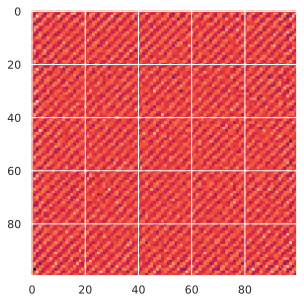

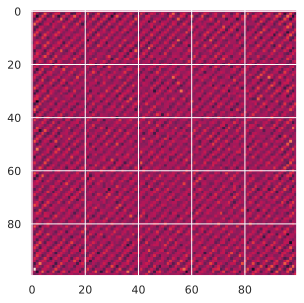

In [35]:
plt.imshow(n_up)
plt.figure()
plt.imshow(n_down)

In [36]:
S_z = 0.5 * (n_up - n_down)
kx, ky, S_z_k = grfuncs.fourier_transform(S_z, length)

(100, 100) (100, 100)


array([], dtype=float64)

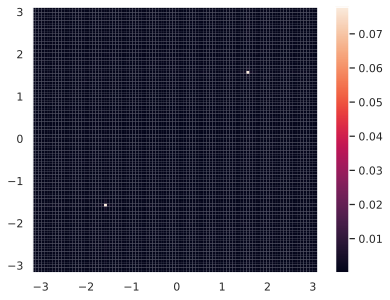

In [37]:
KX, KY = np.meshgrid(kx, ky)
print(KX.shape, S_z_k.shape)
w = 20
# plt.contourf(KX, KY, S_z_k)
# mappable = plt.imshow(S_z_k)
plt.pcolormesh(KX, KY, np.abs(S_z_k), shading="auto")
# plt.tricontourf(KX.flatten(), KY.flatten(), S_z_k.flatten())
# plt.contourf(KX[50-w:50+w, 50-w:50+w], KY[50-w:50+w, 50-w:50+w], S_z_k[50-w:50+w, 50-w:50+w], levels=10)
plt.colorbar()
coords = np.where(np.abs(S_z_k) > 0.7)
KX[coords]
KY[coords]

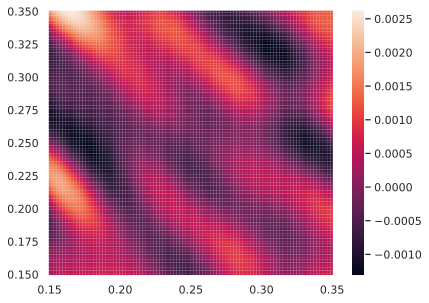

In [15]:
qx = 0.2
qy = 0.2
value = grfuncs.fourier_component(qx, qy, S_z, length)
dq = 0.1
fftvals = np.empty((100, 100), dtype=complex)
qvals = np.linspace(0.25-dq, 0.25+dq, 100)
for i, qx in enumerate(qvals):
    for j, qy in enumerate(qvals):
        fftvals[i, j] = grfuncs.fourier_component(qx, qy, S_z, length)
QX, QY = np.meshgrid(qvals, qvals)
plt.pcolormesh(QX, QY, fftvals.real)
plt.colorbar()

In [31]:
x = y = np.arange(0, length)
X, Y = np.meshgrid(x, y)
initial_S_z = 0.5 * np.cos(2*(X + Y))
kx_p, ky_p, initial_S_z_k = grfuncs.fourier_transform(initial_S_z, length)
KX_P, KY_P = np.meshgrid(kx_p, ky_p)
plt.pcolormesh(KX_P, KY_P, initial_S_z_k.real, shading="auto")
plt.pcolormesh(KX_P, KY_P, initial_S_z_k.real, shading="auto")

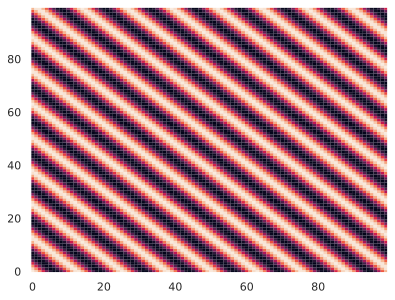

In [8]:
plt.pcolormesh(X, Y, initial_S_z)

TypeError: Image data of dtype complex128 cannot be converted to float

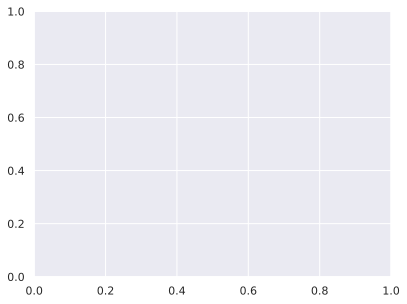

In [21]:
x = y = np.arange(0, length)
X, Y = np.meshgrid(x, y)
func = np.sin((2*np.pi/length) * (X + Y))
kx_p, ky_p, func_k = grfuncs.fourier_transform(func, length)
KX_P, KY_P = np.meshgrid(kx_p, ky_p)
plt.pcolormesh(KX_P, KY_P, func_k, shading="auto")